# 03 — Orthogonal Six-Basis Decomposition

Demonstrates the full projection workflow on a **real blocking event**:

1. Build the orthogonal basis {Φ₁, Φ₂, Φ₃, Φ₄, Φ₅, Φ₆} from the PV anomaly field
2. Project the PV tendency onto the basis → (β, αx, αy, γ₁, γ₂, σ)
3. Lifecycle time curves by looping over ∆h = −13 … +12

In [1]:
import numpy as np
import matplotlib.pyplot as plt

from pvtend import (compute_orthogonal_basis, project_field, R_EARTH,
                    lerp_fields)
from pvtend.plotting import plot_coefficient_curves, plot_field_2d
from pvtend.decomposition.projection import collect_term_fields, ADVECTION_TERMS
from pvtend.decomposition.basis import (PRENORM_PHI1, PRENORM_PHI2, PRENORM_PHI3,
                                        PRENORM_PHI4, PRENORM_PHI5, PRENORM_PHI6)


## 1  Load event data at onset (dh = 0)

In [2]:
DATA_ROOT = "/net/flood/data2/users/x_yan/composite_blocking_tempest" #"/net/flood/data2/users/x_yan/tempest_extreme_4_basis/outputs_tmp"
STAGE = "onset"
# TRACK_GLOB = "track_873_*"   # 2010 June Russian heatwave
# TRACK_GLOB = "track_566_*"   # 2003 European heatwave 2003071308_dh+0
TRACK_GLOB = "track_425_*"   # gif demo

# Extract track ID for use in lifecycle / budget cells
TRACK_ID = TRACK_GLOB.split("_")[1]   # e.g. "425"

# Smoothing degree used throughout (basis + tendency)
SMOOTH_DEG = 3.0

# PV mask specification for basis construction (SI units, PVU)
MASK_SPEC = "< -5e-7"

# Load dh=0 (tendency) and dh=-1 (basis)
d0 = dict(np.load(f"{DATA_ROOT}/{STAGE}/dh=+0/{TRACK_GLOB.replace('*','2000011120_dh+0')}.npz"))
dm1 = dict(np.load(f"{DATA_ROOT}/{STAGE}/dh=-1/{TRACK_GLOB.replace('*','2000011119_dh-1')}.npz"))
X_rel = d0["X_rel"]
Y_rel = d0["Y_rel"]
x_rel = X_rel[0, :]    # 1D
y_rel = Y_rel[:, 0]

print(f"Patch shape : {X_rel.shape}")
print(f"PV anom min (dh=0) : {d0['pv_anom'].min():.3e} PVU")
print(f"PV anom min (dh=-1): {dm1['pv_anom'].min():.3e} PVU")

Patch shape : (29, 49)
PV anom min (dh=0) : -4.404e-06 PVU
PV anom min (dh=-1): -4.414e-06 PVU


## 2  Build orthogonal basis from PV anomaly

In [3]:
# Build basis from current-dh fields (no temporal interpolation)
basis = compute_orthogonal_basis(
    pv_anom=d0["pv_anom"],
    pv_dx=d0["pv_dx"],
    pv_dy=d0["pv_dy"],
    x_rel=x_rel,
    y_rel=y_rel,
    mask=MASK_SPEC,
    apply_smoothing=True,
    smoothing_deg=SMOOTH_DEG,
    grid_spacing=1.5,
)
print("Basis norms :", {k: f"{v:.4e}" for k, v in basis.norms.items()})
print("Scale factors:", basis.scale_factors)

Basis norms : {'beta': '1.6710e+02', 'ax': '2.0464e+01', 'ay': '3.1854e+01', 'gamma1': '6.8153e+00', 'gamma2': '4.6621e+00', 'sigma': '1.6261e+00'}
Scale factors: {'beta': 274122.1874324586, 'ax': 88381521755.55681, 'ay': 127777795608.77637, 'gamma1': 2.6968860209914784e+16, 'gamma2': 1.049971232775223e+16, 'sigma': 7977034660629256.0}


/tmp/ipykernel_3459804/1479912495.py:2: UserWarning: compute_orthogonal_basis: grid_spacing=1.5°, center_lat=60.0°N → dx(center)=83.4 km, dy=166.8 km
  basis = compute_orthogonal_basis(


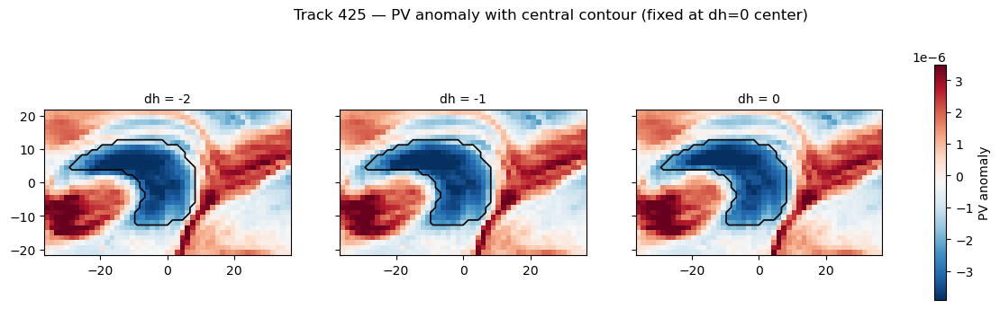

In [4]:
# Visualise pv_anom at dh-2, dh-1, dh=0 — full shading, central contour outline only
dm2 = dict(np.load(f"{DATA_ROOT}/{STAGE}/dh=-2/{TRACK_GLOB.replace('*','2000011118_dh-2')}.npz"))

# Use the mask from the basis (central blob from _select_central_blob)
mask = basis.mask

fig, axes = plt.subplots(1, 3, figsize=(15, 4), sharex=True, sharey=True)

vmin, vmax = np.nanpercentile(d0["pv_anom"], [2, 98])

titles = ["dh = -2", "dh = -1", "dh = 0"]
fields = [dm2["pv_anom"], dm1["pv_anom"], d0["pv_anom"]]

for ax, fld, ttl in zip(axes, fields, titles):
    im = ax.pcolormesh(X_rel, Y_rel, fld, cmap="RdBu_r",
                       vmin=vmin, vmax=vmax, shading="auto")
    # Draw only the central-blob contour boundary
    ax.contour(X_rel, Y_rel, mask.astype(float), levels=[0.5],
               colors="k", linewidths=1.2)
    ax.set_title(ttl, fontsize=10)
    ax.set_aspect("equal")

fig.colorbar(im, ax=axes, label="PV anomaly", shrink=0.85)
fig.suptitle(f"Track {TRACK_ID} — PV anomaly with central contour (fixed at dh=0 center)",
             fontsize=12)
plt.show()

## 3  Visualise the six basis fields

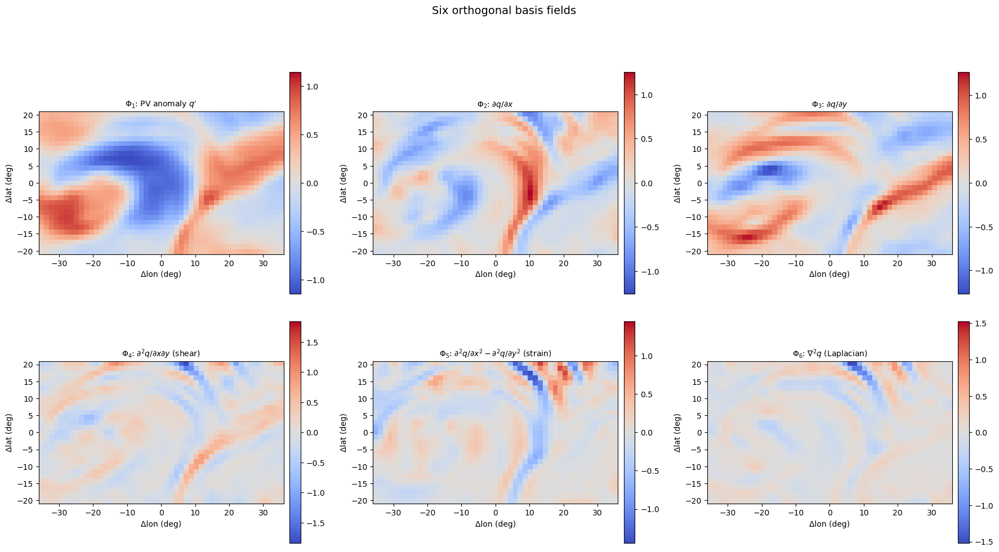

In [5]:
from matplotlib.colors import TwoSlopeNorm

fields = [basis.phi_int, basis.phi_dx, basis.phi_dy,
          basis.phi_def, basis.phi_strain, basis.phi_lap]
titles = [
    r"$\Phi_1$: PV anomaly $q'$",
    r"$\Phi_2$: $\partial q / \partial x$",
    r"$\Phi_3$: $\partial q / \partial y$",
    r"$\Phi_4$: $\partial^2 q / \partial x \partial y$ (shear)",
    r"$\Phi_5$: $\partial^2 q/\partial x^2 - \partial^2 q/\partial y^2$ (strain)",
    r"$\Phi_6$: $\nabla^2 q$ (Laplacian)",
]

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
for ax, fld, title in zip(axes.ravel(), fields, titles):
    vmax = np.nanmax(np.abs(fld))
    if vmax < 1e-30:
        vmax = 1.0
    norm = TwoSlopeNorm(vmin=-vmax, vcenter=0.0, vmax=vmax)
    im = ax.imshow(fld, origin="lower", cmap="coolwarm", norm=norm,
                   extent=[x_rel.min(), x_rel.max(), y_rel.min(), y_rel.max()],
                   aspect="equal")
    ax.set_title(title, fontsize=10)
    ax.set_xlabel("Δlon (deg)")
    ax.set_ylabel("Δlat (deg)")
    plt.colorbar(im, ax=ax, shrink=0.8, pad=0.02)
fig.suptitle("Six orthogonal basis fields", fontsize=14, y=1.02)
fig.tight_layout()
plt.show()

## 4  Project PV tendency onto basis

In [6]:
from pvtend.decomposition.smoothing import gaussian_smooth_nan

pv_dt = d0["pv_anom_dt"] + d0["pv_bar_dt"]   # dq/dt = dq'/dt + dq̄/dt (wavg 300-250-200 hPa)
pv_dt_smooth = gaussian_smooth_nan(pv_dt, smoothing_deg=SMOOTH_DEG, grid_spacing=1.5)

proj = project_field(pv_dt_smooth, basis)

print(f"β  (intensification) = {proj['beta']:.3e}  s⁻¹")
print(f"αx (zonal propagation) = {proj['ax']:.3f}  m/s")
print(f"αy (merid. propagation) = {proj['ay']:.3f}  m/s")
print(f"γ₁ (shear deformation) = {proj['gamma1']:.3e}  m² s⁻¹")
print(f"γ₂ (strain deformation)= {proj['gamma2']:.3e}  m² s⁻¹")
print(f"σ  (Laplacian/diffuse) = {proj['sigma']:.3e}  m² s⁻¹")
print(f"RMSE / max|dq/dt|      = {proj['rmse'] / (np.nanmax(np.abs(pv_dt_smooth)) + 1e-30):.3f}")

β  (intensification) = 6.381e-07  s⁻¹
αx (zonal propagation) = 13.649  m/s
αy (merid. propagation) = 19.078  m/s
γ₁ (shear deformation) = -5.932e+05  m² s⁻¹
γ₂ (strain deformation)= -2.575e+05  m² s⁻¹
σ  (Laplacian/diffuse) = -7.330e+05  m² s⁻¹
RMSE / max|dq/dt|      = 0.077


## 5  2-D component maps

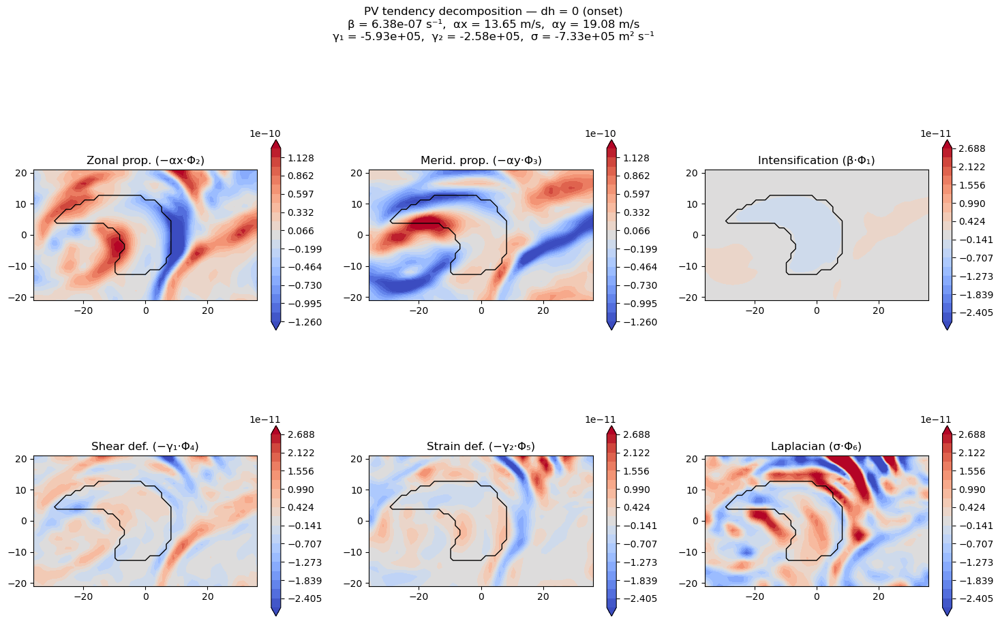

In [7]:
# Reconstruct individual components manually
beta_comp   = proj["beta_raw"]   * basis.phi_int
ax_comp     = -proj["ax_raw"]    * basis.phi_dx
ay_comp     = -proj["ay_raw"]    * basis.phi_dy
gamma1_comp = -proj["gamma1_raw"] * basis.phi_def
gamma2_comp = -proj["gamma2_raw"] * basis.phi_strain
sigma_comp  = proj["sigma_raw"]  * basis.phi_lap

# Separate vmax for each row
vmax_prop = max(np.nanpercentile(np.abs(ax_comp), 95),
                np.nanpercentile(np.abs(ay_comp), 95), 1e-30)
vmax_id   = max(np.nanpercentile(np.abs(beta_comp), 95),
                np.nanpercentile(np.abs(gamma1_comp), 95),
                np.nanpercentile(np.abs(gamma2_comp), 95),
                np.nanpercentile(np.abs(sigma_comp), 95), 1e-30)
levels_prop = np.linspace(-vmax_prop, vmax_prop, 20)
levels_id   = np.linspace(-vmax_id,   vmax_id,   20)

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# --- Row 1: propagation (αx, αy) + intensification (β) ---
for i, (comp, title) in enumerate([
    (ax_comp,   "Zonal prop. (−αx·Φ₂)"),
    (ay_comp,   "Merid. prop. (−αy·Φ₃)"),
    (beta_comp, "Intensification (β·Φ₁)"),
]):
    a = axes[0, i]
    cf = a.contourf(x_rel, y_rel, comp, levels=levels_prop if i < 2 else levels_id,
                    cmap="coolwarm", extend="both")
    a.contour(x_rel, y_rel, basis.mask.astype(float), levels=[0.5],
              colors="k", linewidths=1.0)
    a.set_title(title)
    a.set_aspect("equal")
    plt.colorbar(cf, ax=a, shrink=0.8)

# --- Row 2: deformation (γ₁, γ₂, σ) ---
for i, (comp, title) in enumerate([
    (gamma1_comp, "Shear def. (−γ₁·Φ₄)"),
    (gamma2_comp, "Strain def. (−γ₂·Φ₅)"),
    (sigma_comp,  "Laplacian (σ·Φ₆)"),
]):
    a = axes[1, i]
    cf = a.contourf(x_rel, y_rel, comp, levels=levels_id,
                    cmap="coolwarm", extend="both")
    a.contour(x_rel, y_rel, basis.mask.astype(float), levels=[0.5],
              colors="k", linewidths=1.0)
    a.set_title(title)
    a.set_aspect("equal")
    plt.colorbar(cf, ax=a, shrink=0.8)

subtitle = (
    f"β = {proj['beta']:.2e} s⁻¹,  "
    f"αx = {proj['ax']:.2f} m/s,  "
    f"αy = {proj['ay']:.2f} m/s\n"
    f"γ₁ = {proj['gamma1']:.2e},  "
    f"γ₂ = {proj['gamma2']:.2e},  "
    f"σ = {proj['sigma']:.2e} m² s⁻¹"
)
fig.suptitle("PV tendency decomposition — dh = 0 (onset)\n" + subtitle, y=1.04, fontsize=12)
plt.show()

## 5b  Original vs. Reconstructed PV tendency

wavg_levels in data file: [300 250 200] hPa
=> pv_anom_dt is a pressure-weighted vertical average over [np.int32(300), np.int32(250), np.int32(200)] hPa

Reconstruction quality:
  RMSE             = 1.919e-11
  RMSE / max|dq/dt| = 0.077
  Correlation       = 0.6770


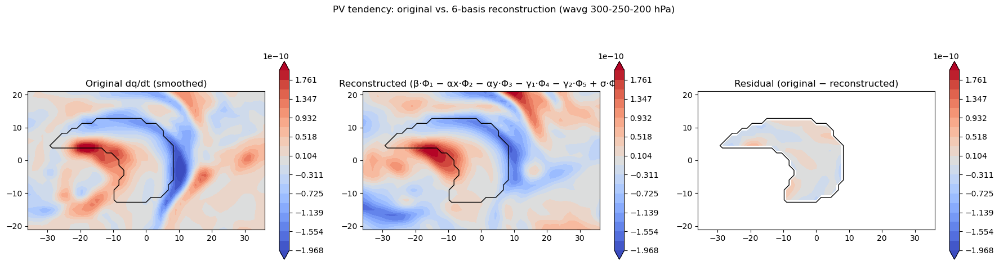

In [8]:

# Original (smoothed) vs. reconstructed PV tendency
recon = proj["recon"]
resid = proj["resid"]

vmax = np.nanpercentile(np.abs(pv_dt_smooth), 99)
levels_cf = np.linspace(-vmax, vmax, 20)

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# --- Original ---
cf0 = axes[0].contourf(x_rel, y_rel, pv_dt_smooth,
                        levels=levels_cf, cmap="coolwarm", extend="both")
axes[0].contour(x_rel, y_rel, basis.mask.astype(float), levels=[0.5],
                colors="k", linewidths=1.0)
axes[0].set_title("Original dq/dt (smoothed)")
axes[0].set_aspect("equal")
plt.colorbar(cf0, ax=axes[0], shrink=0.8)

# --- Reconstructed ---
cf1 = axes[1].contourf(x_rel, y_rel, recon,
                        levels=levels_cf, cmap="coolwarm", extend="both")
axes[1].contour(x_rel, y_rel, basis.mask.astype(float), levels=[0.5],
                colors="k", linewidths=1.0)
axes[1].set_title("Reconstructed (β·Φ₁ − αx·Φ₂ − αy·Φ₃ − γ₁·Φ₄ − γ₂·Φ₅ + σ·Φ₆)")
axes[1].set_aspect("equal")
plt.colorbar(cf1, ax=axes[1], shrink=0.8)

# --- Residual ---
cf2 = axes[2].contourf(x_rel, y_rel, resid,
                        levels=levels_cf, cmap="coolwarm", extend="both")
axes[2].contour(x_rel, y_rel, basis.mask.astype(float), levels=[0.5],
                colors="k", linewidths=1.0)
axes[2].set_title("Residual (original − reconstructed)")
axes[2].set_aspect("equal")
plt.colorbar(cf2, ax=axes[2], shrink=0.8)

# Print which levels are used
print(f"wavg_levels in data file: {d0['wavg_levels']} hPa")
print(f"=> pv_anom_dt is a pressure-weighted vertical average over {list(d0['wavg_levels'])} hPa")
print(f"\nReconstruction quality:")
print(f"  RMSE             = {proj['rmse']:.3e}")
print(f"  RMSE / max|dq/dt| = {proj['rmse'] / (np.nanmax(np.abs(pv_dt_smooth)) + 1e-30):.3f}")
print(f"  Correlation       = {np.corrcoef(pv_dt_smooth[np.isfinite(pv_dt_smooth) & np.isfinite(recon)], recon[np.isfinite(pv_dt_smooth) & np.isfinite(recon)])[0,1]:.4f}")

fig.suptitle("PV tendency: original vs. 6-basis reconstruction (wavg 300-250-200 hPa)", y=1.02)
fig.tight_layout()
plt.show()


## 6  Lifecycle time curves (dh = −13 … +12)

In [9]:
import os, glob

dh_values = list(range(-13, 13))
coefs = {k: [] for k in ["beta", "ax", "ay", "gamma1", "gamma2", "sigma"]}

for dh in dh_values:
    sign = "+" if dh >= 0 else ""
    pattern = f"{DATA_ROOT}/{STAGE}/dh={sign}{dh}/track_{TRACK_ID}_*_dh{sign}{dh}.npz"
    files = sorted(glob.glob(pattern))
    if not files:
        for k in coefs:
            coefs[k].append(np.nan)
        continue

    dd = dict(np.load(files[0]))

    # Build basis from current-dh fields (no temporal offset)
    b = compute_orthogonal_basis(
        dd["pv_anom"], dd["pv_dx"], dd["pv_dy"],
        x_rel, y_rel, mask=MASK_SPEC,
        apply_smoothing=True, smoothing_deg=SMOOTH_DEG, grid_spacing=1.5,
    )
    pv_dt_s = gaussian_smooth_nan(dd["pv_anom_dt"] + dd["pv_bar_dt"], smoothing_deg=SMOOTH_DEG, grid_spacing=1.5)
    p = project_field(pv_dt_s, b)
    for k in coefs:
        coefs[k].append(p[k])

# Convert to arrays
for k in coefs:
    coefs[k] = np.array(coefs[k])

/tmp/ipykernel_3459804/3265218323.py:18: UserWarning: compute_orthogonal_basis: grid_spacing=1.5°, center_lat=60.0°N → dx(center)=83.4 km, dy=166.8 km
  b = compute_orthogonal_basis(


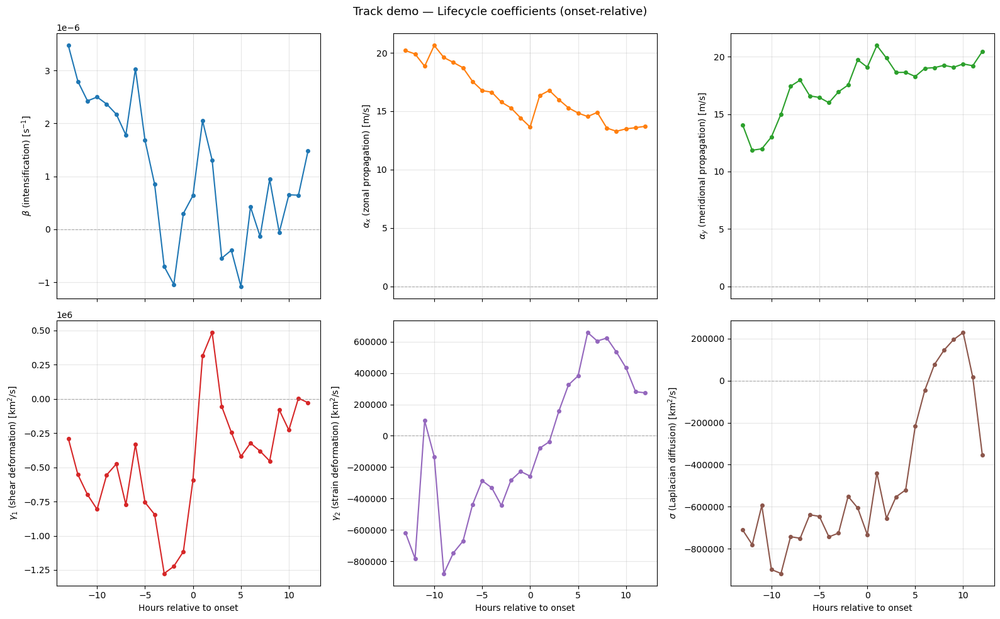

In [10]:
fig = plot_coefficient_curves(
    np.array(dh_values),
    coefs,
    title="Track demo — Lifecycle coefficients (onset-relative)",
    xlabel="Hours relative to onset",
)
plt.show()

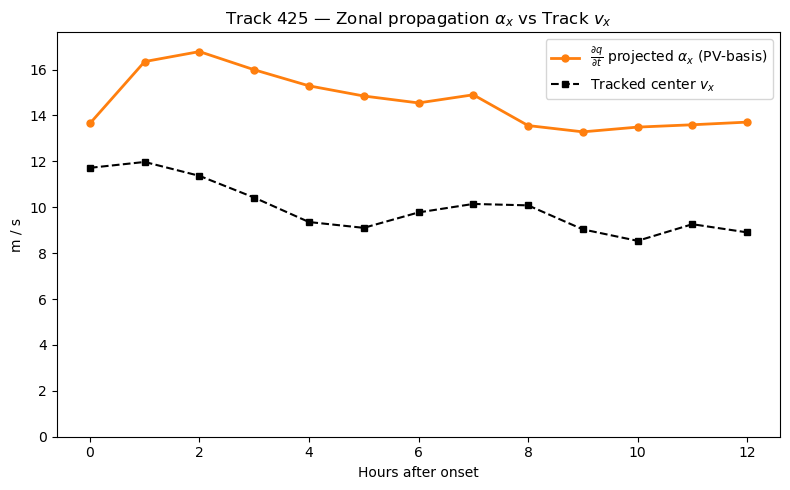

In [11]:
# ── Overlay diagnosed αx with tracking-centre zonal velocity ─────────
# Only dh = 0 … +12 (onset onward); y-axis minimum = 0 m/s.

import re
from datetime import datetime, timedelta

# ── 1. Parse track centres for this track from blockstats ────────────
BLOCKSTATS = "/net/flood/data2/users/x_yan/tracking_tmpp/ERA5_blockstats.txt"
track_rows = []
with open(BLOCKSTATS) as fh:
    for line in fh:
        parts = line.strip().split("\t")
        if parts[0].strip() == TRACK_ID:
            track_rows.append(parts)

# Build arrays: timestamps, lat, lon
_ts_list, _lat_list, _lon_list = [], [], []
for row in track_rows:
    ts_str = row[2].strip().strip('"')
    _ts_list.append(datetime.strptime(ts_str, "%Y-%m-%d %H:%M:%S"))
    _lat_list.append(float(row[3].strip()))
    _lon_list.append(float(row[4].strip()))

ts_arr = np.array(_ts_list)
lat_arr = np.array(_lat_list)
lon_arr = np.array(_lon_list)

# ── 2. Compute track-centre velocity (m/s) via centred differences ───
cos_lat = np.cos(np.radians(lat_arr))
dlat = np.gradient(lat_arr)          # deg/hour (Δt = 1 h)
dlon = np.gradient(lon_arr)          # deg/hour
vx_track = dlon * (np.pi / 180.0) * R_EARTH * cos_lat / 3600.0   # m/s
vy_track = dlat * (np.pi / 180.0) * R_EARTH / 3600.0             # m/s

# ── 3. Identify onset timestamp and map dh → track index ─────────────
onset_ts = datetime.strptime(str(d0["ts"]), "%Y-%m-%d %H:%M:%S")
dh_hours = np.array(dh_values)

# Map each dh to the corresponding track index
track_vx_at_dh = np.full_like(dh_hours, np.nan, dtype=float)
track_vy_at_dh = np.full_like(dh_hours, np.nan, dtype=float)
for i, dh in enumerate(dh_hours):
    target_ts = onset_ts + timedelta(hours=int(dh))
    matches = np.where(ts_arr == target_ts)[0]
    if len(matches) == 1:
        idx = matches[0]
        track_vx_at_dh[i] = vx_track[idx]
        track_vy_at_dh[i] = vy_track[idx]

# ── 4. Single panel: αx vs track vx, dh = 0 … +12 only ─────────────
mask = dh_hours >= 0
dh_pos = dh_hours[mask]
ax_pos = coefs["ax"][mask]
vx_pos = track_vx_at_dh[mask]

fig, ax1 = plt.subplots(figsize=(8, 5))
ax1.plot(dh_pos, ax_pos, "C1-o", ms=5, lw=2, label=r"$\frac{\partial q}{\partial t}$ projected $\alpha_x$ (PV-basis)")
ax1.plot(dh_pos, vx_pos, "k--s", ms=5, lw=1.5, label="Tracked center $v_x$")
ax1.axhline(0, color="grey", lw=0.5, ls=":")
ax1.set_ylim(bottom=0)
ax1.set_xlabel("Hours after onset")
ax1.set_ylabel("m / s")
ax1.set_title(rf"Track {TRACK_ID} — Zonal propagation $\alpha_x$ vs Track $v_x$",
              fontsize=12)
ax1.legend(fontsize=10)
fig.tight_layout()
plt.show()

ERA5 Z files: ['/net/flood/data2/users/x_yan/era/era5_z_2000_01.nc']


/tmp/ipykernel_3459804/2477530852.py:61: UserWarning: compute_orthogonal_basis: grid_spacing=1.5°, center_lat=60.0°N → dx(center)=83.4 km, dy=166.8 km
  basis = compute_orthogonal_basis(


Loaded 26 frames: dh = -13 … 12
Saved GIF → /net/flood/data2/users/x_yan/tmp/track_425_pv_lifecycle.gif


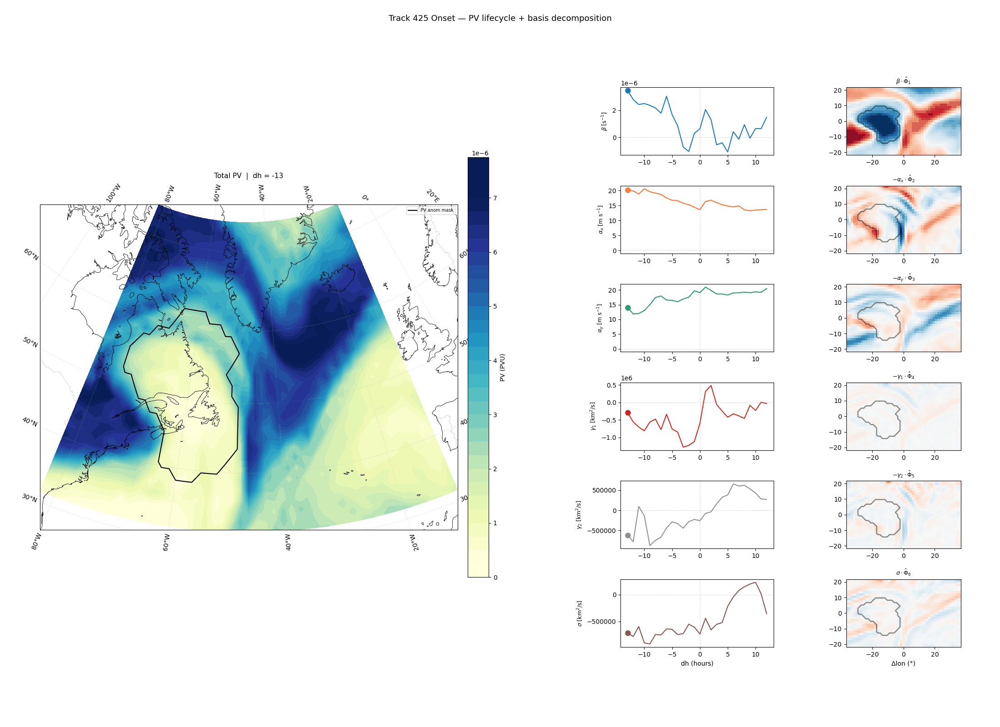

In [12]:
# ── Animated GIF: PV tracking (cartopy) + basis decomposition ────────
# Left : total PV shading on cartopy map
#        + black mask contour (pv_anom threshold — ONLY black contour)
#        + gray Z-overturning contours (circumpolar, wavg 300-250-200)
#        + AWB/CWB bay polygons + centroid markers
#        track centre trajectory from blockstats (dh>=0 only)
# Right: 2 cols × 4 rows
#   col-1 = β, αx, αy, γ 1D lifecycle curve with units
#   col-2 = coef × Φ̂_i  2D field (αx, αy NEGATED) + semi-transparent central contour

import matplotlib.gridspec as gridspec
from matplotlib.animation import FuncAnimation, PillowWriter
from matplotlib.lines import Line2D
from IPython.display import Image as IPImage
from pvtend.decomposition.smoothing import gaussian_smooth_nan
from pvtend.rwb import (
    detect_rwb_events, RWBConfig,
    circumpolar_contours, crop_contour_to_patch,
    reduce_to_2d,
)
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import xarray as xr
from datetime import timedelta

GIF_PATH = "/net/flood/data2/users/x_yan/tmp/track_{}_pv_lifecycle.gif".format(TRACK_ID)

# ── RWB configuration ───────────────────────────────────────────────
rwb_cfg = RWBConfig(try_levels=300, min_vertices=20, area_min_deg2=20.0)
wb_colors = {"AWB": "dodgerblue", "CWB": "tomato", "UNK": "silver"}
H_SCALE = 7000.0
WAVG_LEVELS = np.array([300, 250, 200])

# ── Load full-NH ERA5 Z for circumpolar RWB ─────────────────────────
ERA5_DIR = "/net/flood/data2/users/x_yan/era"
onset_dt = onset_ts  # already parsed in cell 19

# Open ERA5 Z dataset(s) — may span 2 months at month boundaries
era5_z_files = set()
for dh in dh_values:
    t = onset_dt + timedelta(hours=int(dh))
    era5_z_files.add(f"{ERA5_DIR}/era5_z_{t.year}_{t.month:02d}.nc")
era5_z_files = sorted(era5_z_files)
print(f"ERA5 Z files: {era5_z_files}")

ds_z = xr.open_mfdataset(era5_z_files, combine="by_coords")
lat_nh = ds_z.latitude.values   # 90 → 0
lon_nh = ds_z.longitude.values  # -180 → 178.5

# ── Pre-load all dh frames ──────────────────────────────────────────
frames_data = {}
for dh in dh_values:
    sign = "+" if dh >= 0 else ""
    pattern = f"{DATA_ROOT}/{STAGE}/dh={sign}{dh}/track_{TRACK_ID}_*_dh{sign}{dh}.npz"
    files = sorted(glob.glob(pattern))
    if not files:
        continue
    dd = dict(np.load(files[0]))

    # Basis from current-dh fields (no temporal interpolation)
    basis = compute_orthogonal_basis(
        dd["pv_anom"], dd["pv_dx"], dd["pv_dy"],
        x_rel, y_rel, mask=MASK_SPEC,
        apply_smoothing=True, smoothing_deg=SMOOTH_DEG, grid_spacing=1.5,
    )
    pv_dt_s = gaussian_smooth_nan(
        dd["pv_anom_dt"] + dd["pv_bar_dt"],
        smoothing_deg=SMOOTH_DEG, grid_spacing=1.5,
    )
    proj = project_field(pv_dt_s, basis)

    lon_1d = dd["lon_vec_unwrapped"]
    lat_1d = dd["lat_vec"]
    clat = float(dd["center_lat"])
    clon = float(dd["center_lon"])

    # ── Full-NH Z wavg (circumpolar) for this timestamp ──────────────
    ts_str = str(dd["ts"])
    z_snap = ds_z["z"].sel(valid_time=ts_str,
                           pressure_level=WAVG_LEVELS.astype(float))
    z_3d_nh = z_snap.values / 9.81               # (3, nlat, nlon) in metres
    z_wavg_nh = reduce_to_2d(z_3d_nh, WAVG_LEVELS, "wavg",
                              z3d_m=z_3d_nh, H_SCALE=H_SCALE)  # (nlat, nlon)

    # ── Patch-local Z wavg (from npz z_3d) ──────────────────────────
    levels = dd["levels"]
    wavg_idx = np.array([int(np.abs(levels - l).argmin()) for l in WAVG_LEVELS])
    z_wavg_patch = reduce_to_2d(dd["z_3d"][wavg_idx], WAVG_LEVELS, "wavg",
                                 z3d_m=dd["z_3d"][wavg_idx], H_SCALE=H_SCALE)

    # ── RWB detection: circumpolar Z, bay method ─────────────────────
    rwb_evts = detect_rwb_events(
        z_wavg_patch, x_rel, y_rel, cfg=rwb_cfg,
        field_nh=z_wavg_nh, lat_nh=lat_nh, lon_nh=lon_nh,
        centre_lat=clat, centre_lon=clon,
        method="bay",
    )

    # ── Circumpolar contour lines for plotting (crop to patch) ───────
    circ_ctrs = circumpolar_contours(
        z_wavg_nh, lat_nh, lon_nh,
        try_levels=rwb_cfg.try_levels,
        min_vertices=rwb_cfg.min_vertices,
    )
    half_dlat = float(np.max(np.abs(y_rel)))
    half_dlon = float(np.max(np.abs(x_rel)))
    cropped_ctrs = []
    for cc in circ_ctrs:
        cr = crop_contour_to_patch(cc, clat, clon,
                                    half_dlat=half_dlat, half_dlon=half_dlon)
        if cr is not None:
            cropped_ctrs.append(cr)

    frames_data[dh] = {
        "pv_total": dd["pv"],
        "pv_anom": dd["pv_anom"],
        "center_lat": clat,
        "center_lon": clon,
        "lat_vec": lat_1d,
        "lon_vec": lon_1d,
        "basis": basis,
        "proj": proj,
        "rwb_events": rwb_evts,
        "rwb_contours": {c["lev"]: c for c in cropped_ctrs},
    }

dh_avail = sorted(frames_data.keys())
ds_z.close()
print(f"Loaded {len(dh_avail)} frames: dh = {dh_avail[0]} … {dh_avail[-1]}")

# ── Track trajectory from blockstats txt (dh>=0 only) ───────────────
traj_txt_lats = {}
traj_txt_lons = {}
for dh in dh_avail:
    if dh < 0:
        continue
    target_ts = onset_ts + timedelta(hours=int(dh))
    matches = np.where(ts_arr == target_ts)[0]
    if len(matches) == 1:
        traj_txt_lats[dh] = lat_arr[matches[0]]
        traj_txt_lons[dh] = lon_arr[matches[0]]

# ── Precompute global colour limits ─────────────────────────────────
all_pv = np.concatenate([frames_data[dh]["pv_total"].ravel() for dh in dh_avail])
pv_vmin, pv_vmax = np.nanpercentile(all_pv, [2, 98])

coef_keys = ["beta", "ax", "ay", "gamma1", "gamma2", "sigma"]
field_signs = [1.0, -1.0, -1.0, -1.0, -1.0, 1.0]

coef_labels_units = [
    r"$\beta$ [s$^{-1}$]",
    r"$\alpha_x$ [m s$^{-1}$]",
    r"$\alpha_y$ [m s$^{-1}$]",
    r"$\gamma_1$ [km$^2$/s]",
    r"$\gamma_2$ [km$^2$/s]",
    r"$\sigma$ [km$^2$/s]",
]
coef_colors = ["C0", "C1", "C2", "C3", "C4", "C5"]
phi_names = ["phi_int", "phi_dx", "phi_dy", "phi_def", "phi_strain", "phi_lap"]
phi_labels = [r"$\beta \cdot \hat\Phi_1$",
              r"$-\alpha_x \cdot \hat\Phi_2$",
              r"$-\alpha_y \cdot \hat\Phi_3$",
              r"$-\gamma_1 \cdot \hat\Phi_4$",
              r"$-\gamma_2 \cdot \hat\Phi_5$",
              r"$\sigma \cdot \hat\Phi_6$"]

basis_vmax = {}
for ck, pn, sgn in zip(coef_keys, phi_names, field_signs):
    vals = []
    for dh in dh_avail:
        fd = frames_data[dh]
        phi = getattr(fd["basis"], pn)
        c = fd["proj"][ck]
        if np.isfinite(c) and phi is not None:
            vals.append(np.nanmax(np.abs(sgn * c * phi)))
    basis_vmax[ck] = np.nanpercentile(vals, 95) if vals else 1.0

# ── Central projection centred on onset ──────────────────────────────
clon0 = frames_data[0]["center_lon"] if 0 in frames_data else frames_data[dh_avail[0]]["center_lon"]
clat0 = frames_data[0]["center_lat"] if 0 in frames_data else frames_data[dh_avail[0]]["center_lat"]
proj_map = ccrs.LambertConformal(central_longitude=clon0, central_latitude=clat0)
data_crs = ccrs.PlateCarree()

# ── Build figure layout ─────────────────────────────────────────────
fig = plt.figure(figsize=(22, 16))
fig.subplots_adjust(left=0.04, right=0.98)
outer = gridspec.GridSpec(1, 2, width_ratios=[1.4, 1], wspace=0.18)

ax_pv = fig.add_subplot(outer[0], projection=proj_map)

inner = gridspec.GridSpecFromSubplotSpec(6, 2, subplot_spec=outer[1],
                                          hspace=0.45, wspace=0.35)
ax_1d = [fig.add_subplot(inner[i, 0]) for i in range(6)]
ax_2d = [fig.add_subplot(inner[i, 1]) for i in range(6)]

# ── Helper to draw PV map ───────────────────────────────────────────
def draw_pv_map(ax_map, dh, frame_idx):
    fd = frames_data[dh]
    lon2d, lat2d = np.meshgrid(fd["lon_vec"], fd["lat_vec"])
    clat_f = fd["center_lat"]
    clon_f = fd["center_lon"]

    ax_map.set_extent([fd["lon_vec"].min(), fd["lon_vec"].max(),
                       fd["lat_vec"].min(), fd["lat_vec"].max()],
                      crs=data_crs)
    ax_map.add_feature(cfeature.COASTLINE, linewidth=0.6)
    ax_map.add_feature(cfeature.BORDERS, linewidth=0.3, linestyle=":")
    ax_map.gridlines(draw_labels=True, linewidth=0.3, alpha=0.5,
                     x_inline=False, y_inline=False)

    cf = ax_map.contourf(lon2d, lat2d, fd["pv_total"], levels=30,
                          cmap="YlGnBu", vmin=pv_vmin, vmax=pv_vmax,
                          transform=data_crs)

    # Mask boundary — ONLY black contour
    ax_map.contour(lon2d, lat2d, fd["basis"].mask.astype(float),
                   levels=[0.5], colors="k", linewidths=1.5, linestyles="-",
                   transform=data_crs)

    # ── Z overturning contours (gray, circumpolar) & AWB/CWB ────────
    evts = fd["rwb_events"]
    ctr_by_lev = fd["rwb_contours"]

    awb_evts = [ev for ev in evts if ev["wb_type"] == "AWB"]
    cwb_evts = [ev for ev in evts if ev["wb_type"] == "CWB"]

    # Gray Z contour lines (relative → geographic)
    plotted_levels = set()
    for ev in evts:
        clev = ev["contour_level"]
        if clev not in plotted_levels and clev in ctr_by_lev:
            cline = ctr_by_lev[clev]
            geo_lon = cline["x"] + clon_f
            geo_lat = cline["y"] + clat_f
            ax_map.plot(geo_lon, geo_lat,
                        color="0.45", lw=1.8, zorder=3, transform=data_crs)
            plotted_levels.add(clev)

    # AWB polygons (dodgerblue)
    for ev in awb_evts:
        geo_px = np.asarray(ev["polygon_x"]) + clon_f
        geo_py = np.asarray(ev["polygon_y"]) + clat_f
        ax_map.fill(geo_px, geo_py,
                    alpha=0.35, color=wb_colors["AWB"],
                    transform=data_crs, zorder=4)
        ax_map.plot(geo_px, geo_py,
                    color=wb_colors["AWB"], lw=1.5,
                    transform=data_crs, zorder=4)
        cx, cy = ev["centroid"]
        ax_map.plot(cx + clon_f, cy + clat_f, "*",
                    color=wb_colors["AWB"], ms=12,
                    markeredgecolor="w", markeredgewidth=0.6,
                    transform=data_crs, zorder=7)

    # CWB polygons (tomato)
    for ev in cwb_evts:
        geo_px = np.asarray(ev["polygon_x"]) + clon_f
        geo_py = np.asarray(ev["polygon_y"]) + clat_f
        ax_map.fill(geo_px, geo_py,
                    alpha=0.35, color=wb_colors["CWB"],
                    transform=data_crs, zorder=4)
        ax_map.plot(geo_px, geo_py,
                    color=wb_colors["CWB"], lw=1.5,
                    transform=data_crs, zorder=4)
        cx, cy = ev["centroid"]
        ax_map.plot(cx + clon_f, cy + clat_f, "*",
                    color=wb_colors["CWB"], ms=12,
                    markeredgecolor="w", markeredgewidth=0.6,
                    transform=data_crs, zorder=7)

    # Track trajectory (dh >= 0 only)
    past_dhs = [d for d in dh_avail[:frame_idx + 1] if d in traj_txt_lats]
    if past_dhs:
        tl = [traj_txt_lons[d] for d in past_dhs]
        tt = [traj_txt_lats[d] for d in past_dhs]
        ax_map.plot(tl, tt, "r-", lw=2, transform=data_crs, zorder=5)
        ax_map.plot(tl[-1], tt[-1], "ro", ms=8, transform=data_crs, zorder=6)
        if len(tl) > 1:
            ax_map.plot(tl[0], tt[0], "r^", ms=7, transform=data_crs, zorder=6)

    # Legend
    legend_handles = [
        Line2D([0], [0], color="k", lw=1.5, label="PV anom mask"),
    ]
    if plotted_levels:
        legend_handles.append(
            Line2D([0], [0], color="0.45", lw=1.8, label="Z overturn"))
    if awb_evts:
        legend_handles.append(
            Line2D([0], [0], color=wb_colors["AWB"], lw=2, label="AWB"))
    if cwb_evts:
        legend_handles.append(
            Line2D([0], [0], color=wb_colors["CWB"], lw=2, label="CWB"))
    if legend_handles:
        ax_map.legend(handles=legend_handles, loc="upper right", fontsize=7,
                      framealpha=0.8)

    ax_map.set_title(f"Total PV  |  dh = {dh:+d}", fontsize=11)
    return cf

# ── Draw first frame ────────────────────────────────────────────────
dh0 = dh_avail[0]
fd0 = frames_data[dh0]
cf_pv = draw_pv_map(ax_pv, dh0, 0)
cb_pv = fig.colorbar(cf_pv, ax=ax_pv, label="PV (PVU)", shrink=0.75, pad=0.02)

# 1D lifecycle curves with units
markers_1d = []
dh_hours = np.array(dh_values)
for i, (ck, lab_u, col) in enumerate(zip(coef_keys, coef_labels_units, coef_colors)):
    ax_1d[i].plot(dh_hours, coefs[ck], color=col, lw=1.5)
    ax_1d[i].axhline(0, color="grey", lw=0.4, ls=":")
    ax_1d[i].axvline(0, color="grey", lw=0.4, ls=":")
    m, = ax_1d[i].plot(dh0, coefs[ck][dh_values.index(dh0)], "o",
                        color=col, ms=8, zorder=5)
    markers_1d.append(m)
    ax_1d[i].set_ylabel(lab_u, fontsize=9)
    if i == 5:
        ax_1d[i].set_xlabel("dh (hours)")

# 2D basis × coef panels
imgs_2d = []
ct_refs = []
for i, (ck, pn, lab, sgn) in enumerate(zip(coef_keys, phi_names, phi_labels, field_signs)):
    phi = getattr(fd0["basis"], pn)
    c = fd0["proj"][ck] if np.isfinite(fd0["proj"][ck]) else 0.0
    field = sgn * c * phi
    vm = basis_vmax[ck]
    im = ax_2d[i].pcolormesh(X_rel, Y_rel, field, cmap="RdBu_r",
                               vmin=-vm, vmax=vm, shading="auto")
    imgs_2d.append(im)
    ct = ax_2d[i].contour(X_rel, Y_rel, fd0["basis"].mask.astype(float),
                            levels=[0.5], colors="k",
                            linewidths=1.8, linestyles="-", alpha=0.45)
    ct_refs.append(ct)
    ax_2d[i].set_aspect("equal")
    ax_2d[i].set_title(lab, fontsize=9)
    if i == 5:
        ax_2d[i].set_xlabel("Δlon (°)")

fig.suptitle(f"Track {TRACK_ID} Onset — PV lifecycle + basis decomposition",
             fontsize=13, y=0.98)

# ── Animation update ────────────────────────────────────────────────
def update(frame_idx):
    dh = dh_avail[frame_idx]
    fd = frames_data[dh]

    ax_pv.cla()
    draw_pv_map(ax_pv, dh, frame_idx)

    dh_idx = dh_values.index(dh)
    for i, ck in enumerate(coef_keys):
        markers_1d[i].set_data([dh], [coefs[ck][dh_idx]])

    for i, (ck, pn, sgn) in enumerate(zip(coef_keys, phi_names, field_signs)):
        phi = getattr(fd["basis"], pn)
        c = fd["proj"][ck] if np.isfinite(fd["proj"][ck]) else 0.0
        imgs_2d[i].set_array((sgn * c * phi).ravel())
        ct_refs[i].remove()
        ct_refs[i] = ax_2d[i].contour(X_rel, Y_rel,
                                        fd["basis"].mask.astype(float),
                                        levels=[0.5], colors="k",
                                        linewidths=1.8, linestyles="-",
                                        alpha=0.45)

    return markers_1d + imgs_2d

anim = FuncAnimation(fig, update, frames=len(dh_avail),
                      interval=400, blit=False)
anim.save(GIF_PATH, writer=PillowWriter(fps=2.5))
plt.close(fig)

print(f"Saved GIF → {GIF_PATH}")
IPImage(filename=GIF_PATH)

## 6b  Budget closure — RHS term coefficients

In [13]:
# ── Project individual RHS terms onto the orthogonal basis ──────────

TERM_NAMES = [
    "dq/dt",
    r"$-\bar{u}\,q'_x$",
    r"$-v'\,\bar{q}_y$",
    r"$-\omega\,q_p$",
    "$Q$",
    r"Diabatic Divergence",
    "Rot. eddy",
    r"$\Sigma$(-adv) + $Q$",
]

# Use canonical 12 basic cross-terms (anom/bar × pv_anom/pv_bar)
ADV_12 = list(ADVECTION_TERMS)

term_coefs = {name: {k: [] for k in ["beta", "ax", "ay", "gamma1", "gamma2", "sigma"]}
              for name in TERM_NAMES}

smooth = lambda f: gaussian_smooth_nan(f, smoothing_deg=SMOOTH_DEG, grid_spacing=1.5)

def _append_nan():
    for name in TERM_NAMES:
        for k in term_coefs[name]:
            term_coefs[name][k].append(np.nan)

for dh in dh_values:
    sign = "+" if dh >= 0 else ""
    pattern = f"{DATA_ROOT}/{STAGE}/dh={sign}{dh}/track_{TRACK_ID}_*_dh{sign}{dh}.npz"
    files = sorted(glob.glob(pattern))
    if not files:
        _append_nan(); continue
    dd = dict(np.load(files[0]))

    # Basis from current-dh fields (no temporal interpolation)
    b = compute_orthogonal_basis(
        dd["pv_anom"], dd["pv_dx"], dd["pv_dy"],
        x_rel, y_rel, mask=MASK_SPEC,
        apply_smoothing=True, smoothing_deg=SMOOTH_DEG, grid_spacing=1.5,
    )

    def proj_term(field_2d):
        return project_field(smooth(field_2d), b)

    # --- dq/dt (total) ---
    p = proj_term(dd["pv_anom_dt"] + dd["pv_bar_dt"])
    for k in ["beta", "ax", "ay", "gamma1", "gamma2", "sigma"]:
        term_coefs["dq/dt"][k].append(p[k])

    # --- Individual RHS terms ---
    rhs_fields = [
        (r"$-\bar{u}\,q'_x$",          -dd["u_rot_bar_pv_anom_dx"]),
        (r"$-v'\,\bar{q}_y$",           -dd["v_rot_anom_pv_bar_dy"]),
        (r"$-\omega\,q_p$",             -(dd["w_dry_pv_anom_dp"]
                                         + dd["w_dry_pv_bar_dp"]
                                         + dd["w_moist_pv_anom_dp"]
                                         + dd["w_moist_pv_bar_dp"])),
        ("$Q$",                          dd["Q"]),
        (r"Diabatic Divergence",       -(dd["u_div_moist_pv_anom_dx"]
                                         + dd["v_div_moist_pv_anom_dy"])),
        ("Rot. eddy",                   -(dd["u_rot_anom_pv_anom_dx"]
                                         + dd["v_rot_anom_pv_anom_dy"])),
    ]
    for name, fld in rhs_fields:
        p = proj_term(fld)
        for k in ["beta", "ax", "ay", "gamma1", "gamma2", "sigma"]:
            term_coefs[name][k].append(p[k])

    # --- Closure: -Σ(12 advection terms) + Q ---
    closure_field = -sum(dd[t] for t in ADV_12) + dd["Q"]
    p = proj_term(closure_field)
    for k in ["beta", "ax", "ay", "gamma1", "gamma2", "sigma"]:
        term_coefs[r"$\Sigma$(-adv) + $Q$"][k].append(p[k])

# Convert to arrays
for name in TERM_NAMES:
    for k in term_coefs[name]:
        term_coefs[name][k] = np.array(term_coefs[name][k])

print("Budget projection done.")


/tmp/ipykernel_3459804/788586281.py:36: UserWarning: compute_orthogonal_basis: grid_spacing=1.5°, center_lat=60.0°N → dx(center)=83.4 km, dy=166.8 km
  b = compute_orthogonal_basis(


Budget projection done.


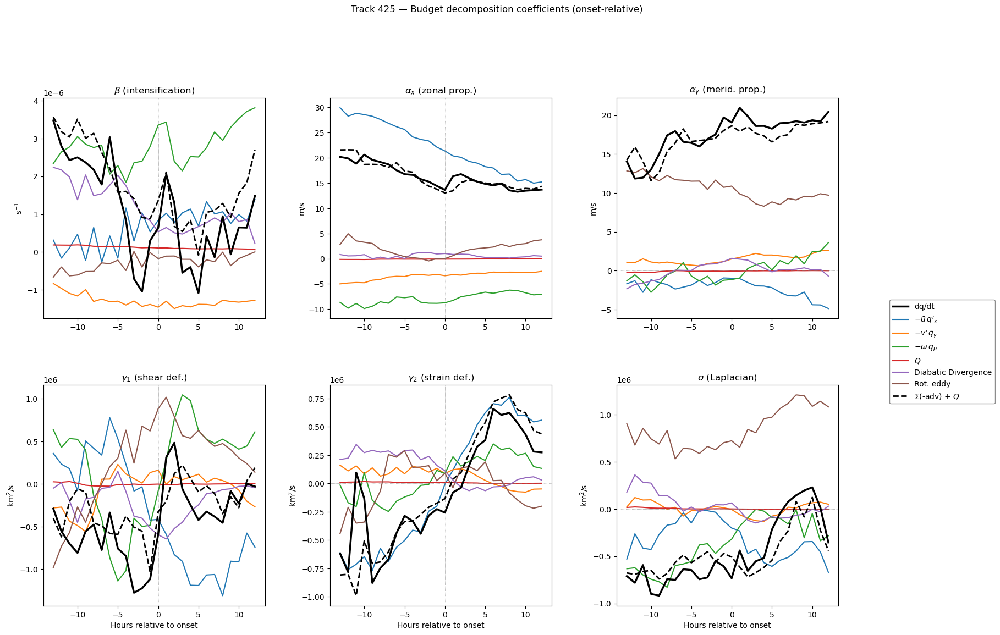

In [14]:
# ── Plot 6-panel budget closure curves ──────────────────────────────

# Use gridspec: 2×3 grid, last column for legend
fig = plt.figure(figsize=(22, 12))
gs = fig.add_gridspec(2, 4, width_ratios=[1, 1, 1, 0.35], wspace=0.35, hspace=0.3)

ax_panels = [
    fig.add_subplot(gs[0, 0]),
    fig.add_subplot(gs[0, 1]),
    fig.add_subplot(gs[0, 2]),
    fig.add_subplot(gs[1, 0]),
    fig.add_subplot(gs[1, 1]),
    fig.add_subplot(gs[1, 2]),
]
ax_legend = fig.add_subplot(gs[:, 3])
ax_legend.axis("off")

coef_info = [
    ("beta",   r"$\beta$ (intensification)",      r"s$^{-1}$"),
    ("ax",     r"$\alpha_x$ (zonal prop.)",       "m/s"),
    ("ay",     r"$\alpha_y$ (merid. prop.)",      "m/s"),
    ("gamma1", r"$\gamma_1$ (shear def.)",        r"km$^2$/s"),
    ("gamma2", r"$\gamma_2$ (strain def.)",       r"km$^2$/s"),
    ("sigma",  r"$\sigma$ (Laplacian)",           r"km$^2$/s"),
]

# Colour/style per term
tab_colors = plt.cm.tab10(np.linspace(0, 1, 10))
term_style = {
    "dq/dt":                       dict(color="k",            lw=2.5, ls="-",  zorder=10),
    r"$\Sigma$(-adv) + $Q$":       dict(color="k",            lw=2.0, ls="--", zorder=9),
    r"$-\bar{u}\,q'_x$":           dict(color=tab_colors[0],  lw=1.5, ls="-"),
    r"$-v'\,\bar{q}_y$":           dict(color=tab_colors[1],  lw=1.5, ls="-"),
    r"$-\omega\,q_p$":              dict(color=tab_colors[2],  lw=1.5, ls="-"),
    "$Q$":                          dict(color=tab_colors[3],  lw=1.5, ls="-"),
    r"Diabatic Divergence":         dict(color=tab_colors[4],  lw=1.5, ls="-"),
    "Rot. eddy":                    dict(color=tab_colors[5],  lw=1.5, ls="-"),
}

dh_arr = np.array(dh_values)
handles_all = []
for ax, (key, title, unit) in zip(ax_panels, coef_info):
    for name in TERM_NAMES:
        st = term_style[name]
        h, = ax.plot(dh_arr, term_coefs[name][key], label=name, **st)
        if ax is ax_panels[0]:
            handles_all.append(h)
    ax.axhline(0, color="gray", lw=0.5, ls=":")
    ax.axvline(0, color="gray", lw=0.5, ls=":")
    ax.set_title(title)
    ax.set_ylabel(unit)

for _ax in ax_panels[3:]:
    _ax.set_xlabel("Hours relative to onset")

# Legend in the pseudo-subplot
ax_legend.legend(handles_all, TERM_NAMES, loc="center", fontsize=10,
                 frameon=True, framealpha=0.9, edgecolor="gray")

fig.suptitle(f"Track {TRACK_ID} — Budget decomposition coefficients (onset-relative)", y=1.02)
plt.show()

## Summary

- **`compute_orthogonal_basis`** builds the six Gram-Schmidt-orthogonalised
  basis fields (Φ₁…Φ₆) from the PV anomaly, its gradients, and second derivatives.
- **`project_field`** decomposes any 2-D field (e.g. dq/dt) into
  intensification (β), propagation (αx, αy), shear (γ₁), strain (γ₂), and Laplacian (σ) coefficients.
- The lifecycle curve shows how these coefficients evolve
  from 13 h before onset to 12 h after.